# Part 2 of Image Processing with scikit-image

In [1]:
# import basic library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
# show image function
def show_image(image, title='Image', cmap_type='gray'):
    plt.figure(figsize=(12,8))
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [3]:
# show comparison of 2 or 3 image
def show_comparison(image1, image2, title1='title1', title2='title2', cmap_type='gray'):
    fig, axarr = plt.subplots(1,2, figsize=(12,5))
    for aa in axarr:
        aa.set_axis_off()

    axarr[0].imshow(image1, cmap=cmap_type)
    axarr[1].imshow(image2, cmap=cmap_type)

    axarr[0].set_title(title1)
    axarr[1].set_title(title2)
    

    plt.show()

def show_three(image1, image2, image3, title1='title1', title2='title2', title3='title3', cmap_type='gray'):
    
    fig, axarr = plt.subplots(1,3, figsize=(20,5))
    for aa in axarr:
        aa.set_axis_off()

    axarr[0].imshow(image1, cmap=cmap_type)
    axarr[1].imshow(image2, cmap=cmap_type)
    axarr[2].imshow(image3, cmap=cmap_type)

    axarr[0].set_title(title1)
    axarr[1].set_title(title2)
    axarr[2].set_title(title3)
    plt.show()

In [4]:
from skimage import data
from skimage.io import imread

## Image Restoration/Reconstruction
- Fixing damaged images
- Text removing
- Logo removing
- Object removing

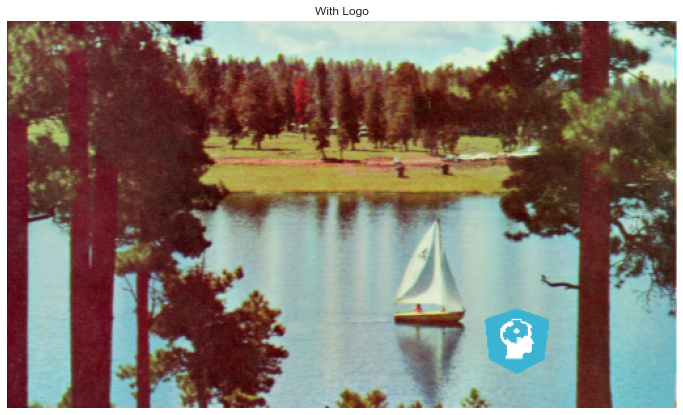

In [5]:
image = imread('data/img/chapter 3/4.2.06_w_logo_2_2.png')
show_image(image, 'With Logo')

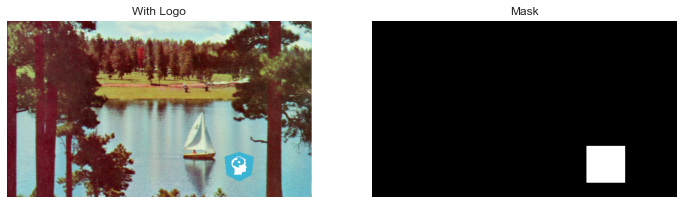

In [6]:
# create masking in area that want to restore
mask = np.zeros(image.shape[:-1])
mask[210:272, 360:425] = 1

show_comparison(image, mask, 'With Logo', 'Mask')

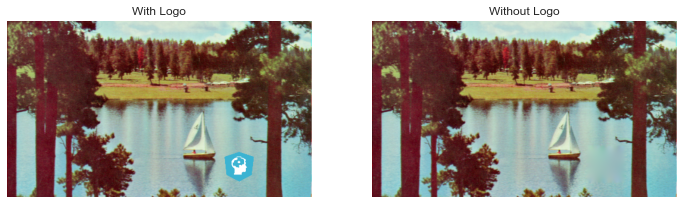

In [7]:
from skimage.restoration import inpaint

removed = inpaint.inpaint_biharmonic(image, mask, multichannel=True)

show_comparison(image, removed, 'With Logo', 'Without Logo')

## Noise

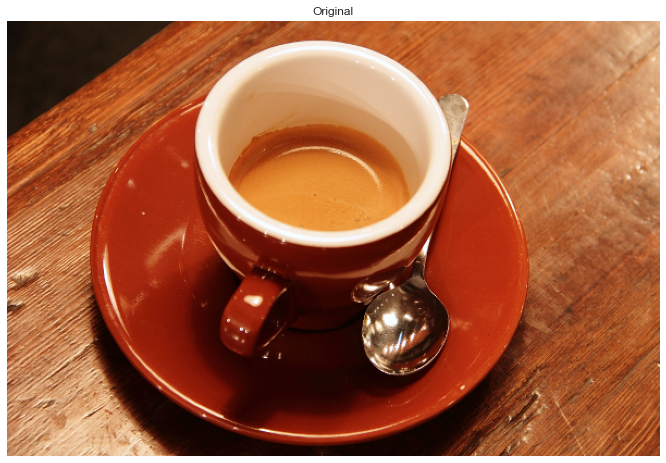

In [8]:
# coffee image
coffee_img = data.coffee()

show_image(coffee_img, 'Original')

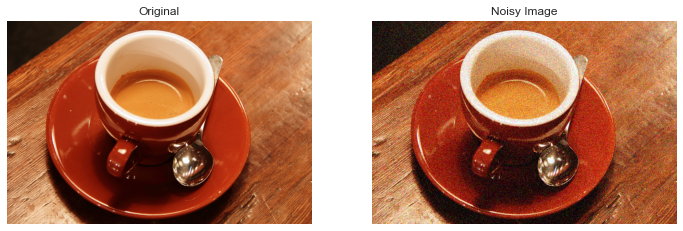

In [9]:
from skimage.util import random_noise

noise_img = random_noise(coffee_img)

show_comparison(coffee_img, noise_img, 'Original', 'Noisy Image')

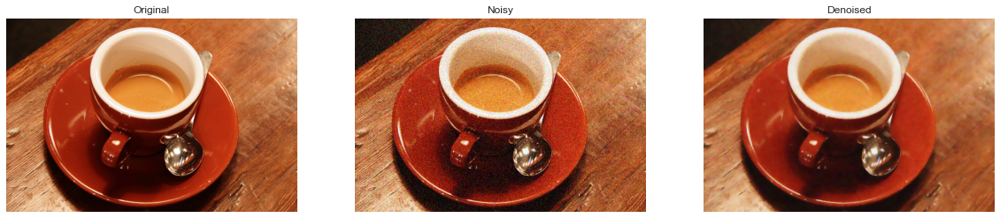

In [10]:
# denoising image (total variation, bilateral)

from skimage.restoration import denoise_tv_chambolle

denoised = denoise_tv_chambolle(noise_img, weight=.1, multichannel=True)

show_three(coffee_img, noise_img, denoised, 'Original', 'Noisy', 'Denoised')

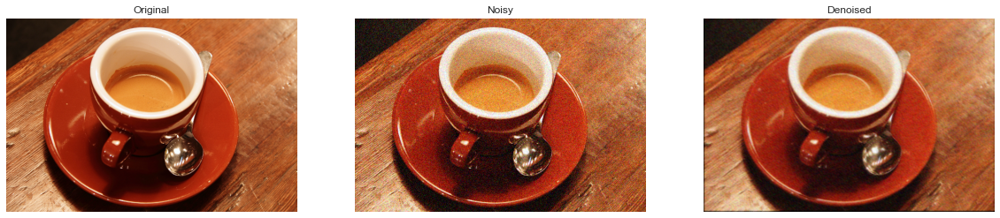

In [11]:
# bilateral (less smooth)
from skimage.restoration import denoise_bilateral

denoised_bi= denoise_bilateral(noise_img, multichannel=True)

show_three(coffee_img, noise_img, denoised_bi, 'Original', 'Noisy', 'Denoised')

## Image Segmentation (Superpixels)

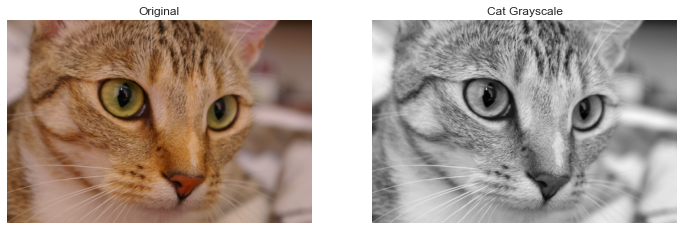

In [12]:
# coloring
from skimage import color

cat = data.chelsea()

cat_grayscale = color.rgb2gray(cat)
show_comparison(cat, cat_grayscale, 'Original','Cat Grayscale')

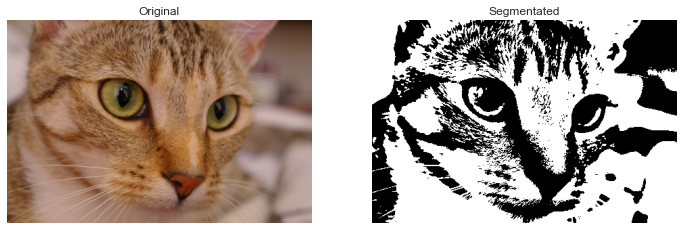

In [13]:
# thresholding
from skimage.filters import threshold_otsu

thresh = threshold_otsu(cat_grayscale)

cat_seg = cat_grayscale > thresh

show_comparison(cat, cat_seg, 'Original', 'Segmentated')

In [14]:
# SLIC (unsupervised segmentation)
from skimage.segmentation import slic
from skimage.color import label2rgb

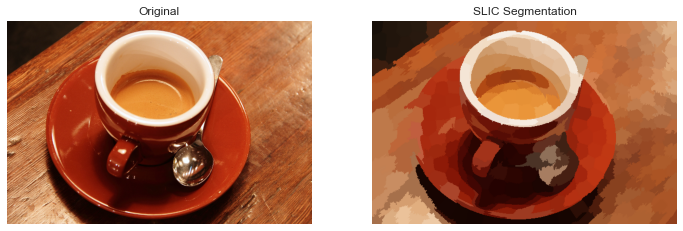

In [15]:
segments = slic(coffee_img, n_segments=400)
seg_image = label2rgb(segments, coffee_img, kind='avg')
show_comparison(coffee_img, seg_image, 'Original', 'SLIC Segmentation')

## Contours

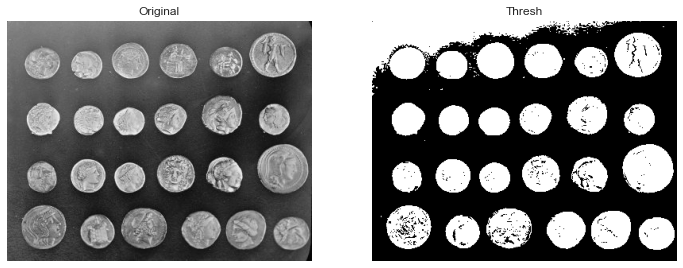

In [16]:
from skimage.filters import threshold_otsu

coins = data.coins()

thresh = threshold_otsu(coins)

coin_thresh = coins > thresh

show_comparison(coins, coin_thresh, 'Original', 'Thresh')

In [17]:
from skimage import measure

coin_contours = measure.find_contours(coin_thresh, 0.8)
type(coin_contours)

list

## Detect Face Edges with Canny

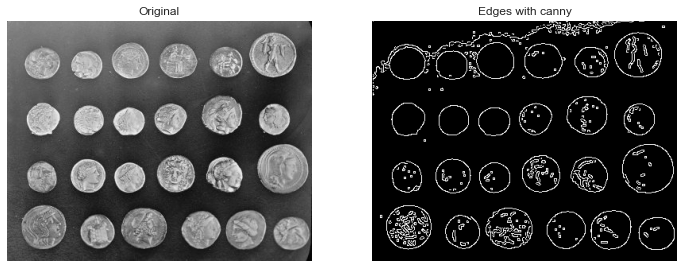

In [18]:
from skimage.feature import canny

coins_canny = canny(coin_thresh)

show_comparison(coins, coins_canny, 'Original', 'Edges with canny')

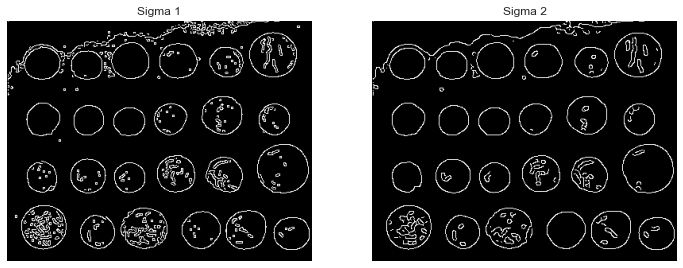

In [19]:
# canny with sigma
canny_sigma = canny(coin_thresh, sigma=2)

show_comparison(coins_canny, canny_sigma, 'Sigma 1', 'Sigma 2')

## Corner Detection

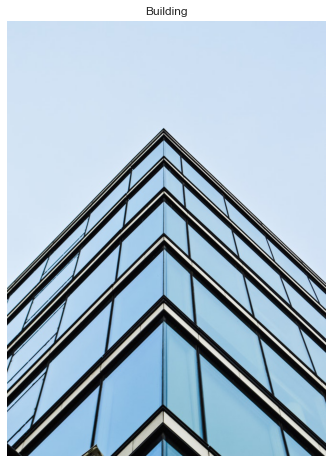

In [20]:
building = imread('data/img/chapter 4/corners_building_top.jpg')

show_image(building, 'Building')

In [21]:
def show_image_with_corners(image, coords, title='Corners detected'):
    plt.figure(figsize=(12,8))
    plt.imshow(image, interpolation='nearest', cmap='gray')
    plt.title(title)
    plt.plot(coords[:,1], coords[:,0], '+r', markersize=15)
    plt.axis('off')
    plt.show()

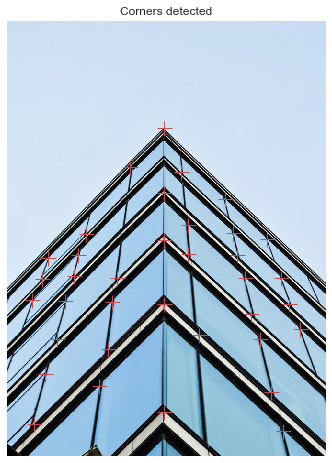

In [22]:
# harris corner detector
from skimage.feature import corner_harris, corner_peaks

build_gray = color.rgb2gray(building)

build_measure = corner_harris(build_gray)
coords = corner_peaks(build_measure, min_distance=40)

show_image_with_corners(building, coords)

## Face Detection

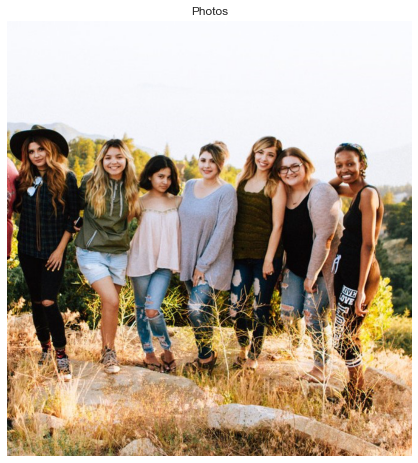

In [30]:
photos = imread('data/img/chapter 4/face_det_friends22.jpg')

show_image(photos, 'Photos')

In [31]:
# define show detected face function
from matplotlib import patches
def show_detected_face(image, detected, title='Face Detector'):
    plt.figure(figsize=(12,8))
    plt.imshow(image)
    img_desc = plt.gca()
    plt.set_cmap('gray')
    plt.title(title)
    plt.axis('off')

    for patch in detected:
        img_desc.add_patch(
            patches.Rectangle(
                (patch['c'], patch['r']),
                patch['width'],
                patch['height'],
                fill=False, color='r', linewidth=2
            )
        )
    plt.show()

In [32]:
from skimage.feature import Cascade

trained_file = data.lbp_frontal_face_cascade_filename()

detector = Cascade(trained_file)

# apply detector on image
detected = detector.detect_multi_scale(img=photos, scale_factor=1.2, step_ratio=1, min_size=(10,10), max_size=(200,200))

print(detected)

[{'r': 202, 'c': 31, 'width': 36, 'height': 36}, {'r': 207, 'c': 152, 'width': 47, 'height': 47}, {'r': 217, 'c': 311, 'width': 39, 'height': 39}, {'r': 242, 'c': 237, 'width': 41, 'height': 41}, {'r': 202, 'c': 402, 'width': 45, 'height': 45}, {'r': 219, 'c': 533, 'width': 48, 'height': 48}, {'r': 218, 'c': 440, 'width': 52, 'height': 52}]


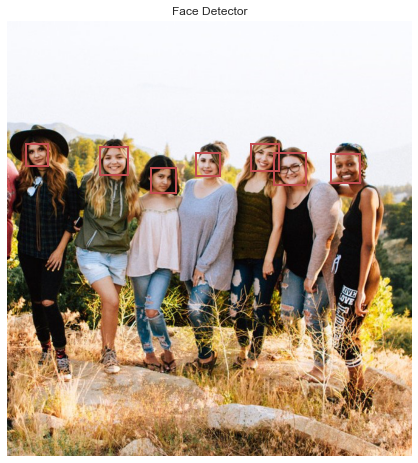

In [33]:
show_detected_face(photos, detected)